## Лекція 55. Генеративно-змагальна мережа

In [11]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.layers import Input, BatchNormalization, LeakyReLU, Reshape
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, Activation, Concatenate
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical
from tqdm.notebook import tqdm
# Бібліотека для роботи з GIF
import imageio
from IPython.display import Image
#
import matplotlib.pyplot as plt
import os
import ipywidgets
import warnings
warnings.filterwarnings("ignore")

In [3]:
#!jupyter nbextension enable --py widgetsnbextension

In [12]:
DEPTH = 10
(train_images, train_labels), (_, _) = tf.keras.datasets.mnist.load_data()
train_images = train_images.reshape(train_images.shape[0], 28, 28, 1).astype('float32')
train_images = train_images / 255 # нормалізуємо в [0, 1]
train_labels = np.array(to_categorical(train_labels, DEPTH))

In [13]:
RANDOM_DIM = 100

class DataGenerator():
    def __init__(self, train_images, train_labels, batches_per_epoch, batch_size):
        self.train_images = train_images
        self.train_labels = train_labels
        self.batches_per_epoch = batches_per_epoch
        self.batch_size = batch_size
    
    @staticmethod
    def rand_norm(npoints=1, ndim=RANDOM_DIM):
        rand_vec = np.random.normal(0, 1, size=[npoints, ndim])
        # проекция на поверхю сфери
        # rand_vec = rand_vec / np.sqrt(np.sum(np.square(rand_vec), axis=1))[:, np.newaxis]
        return rand_vec

    def __len__(self):
        return self.batches_per_epoch
    
    def batch(self):
        rand_images_indexes = np.random.randint(0, train_images.shape[0], size=self.batch_size)
        image_batch = train_images[rand_images_indexes]
        labels_batch = train_labels[rand_images_indexes]
        return image_batch, labels_batch
    
    def __iter__(self):
        for b in tqdm(range(self.batches_per_epoch), leave=False):
            yield self.batch()
            
    def rand_batch(self):
        rand_vec = self.rand_norm(self.batch_size)
        rand_labels = np.random.randint(0, 10, size=[self.batch_size])
        rand_labels = np.array(to_categorical(rand_labels, DEPTH))
        return [rand_vec, rand_labels]

np.random.seed(42)
images_indexes = np.random.randint(0, len(train_images), size=16)
PICS_FROM_DATASET = [train_images[images_indexes], train_labels[images_indexes]]
FIXED_NOISE = [DataGenerator.rand_norm(16), train_labels[images_indexes]]

In [14]:
def make_generator():
    complexity = 80
    alpha = 0.2
    
    random_vector = Input(shape=[RANDOM_DIM])
    labels = Input(shape=[DEPTH])
    
    X = Concatenate()([random_vector, labels])
    # 1 шар
    X = Dense(7 * 7 * int(complexity/2),
                          input_dim=RANDOM_DIM,
                          kernel_initializer=tf.keras.initializers.RandomNormal(stddev=0.02))(X)
    X = BatchNormalization()(X)
    X = LeakyReLU(alpha)(X)
    
    X = Reshape((7, 7, int(complexity/2)))(X)
    
    # 2 шар
    X = Conv2DTranspose(int(complexity), 
                        kernel_size=(5, 5),
                        strides=(2, 2),
                        padding='same')(X)
    X = BatchNormalization()(X)
    X = LeakyReLU(alpha)(X)

    # 3 шар
    X = Conv2DTranspose(int(complexity),
                        kernel_size=(5, 5),
                        strides=(1, 1),
                        padding='same')(X)
    X = BatchNormalization()(X)
    X = LeakyReLU(alpha)(X)
    
    # 4 шар
    X = Conv2DTranspose(int(complexity),
                        kernel_size=(5, 5),
                        strides=(1, 1),
                        padding='same')(X)
    X = BatchNormalization()(X)
    X = LeakyReLU(alpha)(X)
    
    # 5 шар
    X = Conv2DTranspose(int(complexity),
                        kernel_size=(5, 5),
                        strides=(1, 1),
                        padding='same')(X)
    X = BatchNormalization()(X)
    X = LeakyReLU(alpha)(X)
    
    # 6 шар
    X = Conv2DTranspose(1,
                        kernel_size=(5, 5),
                        strides=(2, 2),
                        padding='same')(X)
    X = Activation('sigmoid')(X)
    
    model = Model(inputs=[random_vector, labels], outputs=X, name='generator')
    model.compile(loss='binary_crossentropy',
                  metrics=['acc'],
                  optimizer='sgd')
    model.summary()
    return model
generator = make_generator()

Model: "generator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 100)]        0           []                               
                                                                                                  
 input_5 (InputLayer)           [(None, 10)]         0           []                               
                                                                                                  
 concatenate_1 (Concatenate)    (None, 110)          0           ['input_4[0][0]',                
                                                                  'input_5[0][0]']                
                                                                                                  
 dense_1 (Dense)                (None, 1960)         217560      ['concatenate_1[0][0]']  

Folder already exists
1/1 [==============================] - 0s 259ms/step


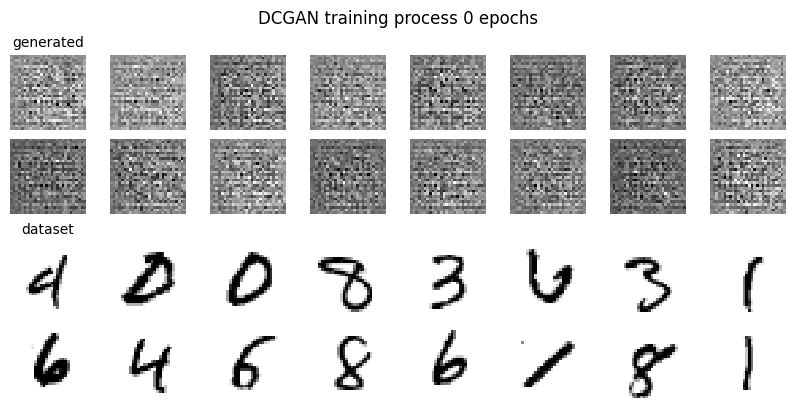

In [15]:
def mkdir_p(path):
    try:
        os.makedirs(path)
    except OSError:
        print('Folder already exists')

def plot_and_save_images(generated_images, folder_name, title, cols, rows, figsize, show=False, subtitles=False):
    fig, axs = plt.subplots(rows, cols, constrained_layout=True)
    fig.set_figheight(figsize[0])
    fig.set_figwidth(figsize[1])
    for i in range(rows):
        for j in range(cols):
            axs[i][j].imshow(generated_images[i][j], interpolation='nearest', cmap='gray_r')
            axs[i][j].axis('off')
            if not subtitles is None:
                if i == 0 and j == 0:
                    axs[i][j].set_title(subtitles[0], fontsize=10)
                if i == int(rows/2) and j == 0:
                    axs[i][j].set_title(subtitles[1], fontsize=10)
    
    fig.suptitle(title, fontsize=12)
    plt.savefig(os.path.join(folder_name, title + '.png'))
    if show:
        plt.show()
    plt.close()


def plot_generated_images(noise, folder_name, title, cols=8, rows=4, figsize=(4, 8), show=False, subtitles=('generated', 'dataset')):
    generated_images = generator.predict(noise)
    images = np.concatenate([generated_images, PICS_FROM_DATASET[0]])
    images = images.reshape(rows, cols, 28, 28)
    plot_and_save_images(images, folder_name, title, cols, rows, figsize, show, subtitles)
    

folder_name = 'GAN_pics_for_gif'
mkdir_p(os.path.join(folder_name))

title = f"DCGAN training process {0} epochs"
plot_generated_images(FIXED_NOISE, folder_name, title, show=True)

In [16]:
def optimizer():
    return tf.keras.optimizers.Adam(lr=0.0002, beta_1=0.5)

In [17]:
def make_discriminator():
    complexity = 70
    drop_rate = 0.2
    alpha = 0.2
    
    inp = Input(shape=(28, 28, 1))
    X = inp
    # 1 шар
    X = Conv2D(int(complexity/4),
               kernel_size=(5, 5),
               strides=(2, 2),
               kernel_initializer=tf.keras.initializers.RandomNormal(stddev=0.02),
               padding='same')(X)
    X = LeakyReLU(alpha)(X)
    X = Dropout(drop_rate)(X)
    
    # 2 шар
    X = Conv2D(int(complexity/2),
               kernel_size=(5, 5),
               strides=(2, 2),
               kernel_initializer=tf.keras.initializers.RandomNormal(stddev=0.02),
               padding='same')(X)
    X = LeakyReLU(alpha)(X)
    X = Dropout(drop_rate)(X)
    
    # 3 шар
    X = Conv2D(int(complexity),
               kernel_size=(5, 5),
               strides=(2, 2),
               kernel_initializer=tf.keras.initializers.RandomNormal(stddev=0.02),
               padding='same')(X)
    X = LeakyReLU(alpha)(X)
    X = Dropout(drop_rate)(X)
    
    # 4 шар
    X = Conv2D(int(2*complexity),
               kernel_size=(5, 5),
               strides=(1, 1),
               kernel_initializer=tf.keras.initializers.RandomNormal(stddev=0.02),
            padding='same')(X)
    X = LeakyReLU(alpha)(X)
    X = Dropout(drop_rate)(X)
    
    # 5 шар
    X = Conv2D(int(complexity),
               kernel_size=(5, 5),
               strides=(1, 1),
               kernel_initializer=tf.keras.initializers.RandomNormal(stddev=0.02),
               padding='same')(X)
    X = LeakyReLU(alpha)(X)
    X = Dropout(drop_rate)(X)

    # 6 шар
    X = Flatten()(X)
    X_real_fake = Dense(1, activation='sigmoid', name='real_fake')(X)
    X_labels = Dense(DEPTH, activation='softmax', name='labels')(X)
    
    model = Model(inputs=inp, outputs=[X_real_fake, X_labels], name='discriminator')
    model.compile(loss={'real_fake': 'binary_crossentropy',
                        'labels': 'categorical_crossentropy'},
                  loss_weights={'real_fake':1,
                                'labels': 1},
                  optimizer=optimizer(),
                  metrics={'real_fake':'acc'})
    
    model.summary()
    return model
discriminator = make_discriminator()

Model: "discriminator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 28, 28, 1)]  0           []                               
                                                                                                  
 conv2d_5 (Conv2D)              (None, 14, 14, 17)   442         ['input_6[0][0]']                
                                                                                                  
 leaky_re_lu_15 (LeakyReLU)     (None, 14, 14, 17)   0           ['conv2d_5[0][0]']               
                                                                                                  
 dropout_5 (Dropout)            (None, 14, 14, 17)   0           ['leaky_re_lu_15[0][0]']         
                                                                                      

In [8]:
discriminator.predict(generator.predict(FIXED_NOISE))

1/1 [==============================] - 0s 101ms/step


[array([[0.49942556],
        [0.49942836],
        [0.499427  ],
        [0.49942735],
        [0.49942753],
        [0.49942562],
        [0.49942765],
        [0.49942663],
        [0.49942788],
        [0.49942777],
        [0.49942675],
        [0.4994302 ],
        [0.4994272 ],
        [0.4994284 ],
        [0.49942604],
        [0.49942854]], dtype=float32),
 array([[0.09997186, 0.10015705, 0.09999819, 0.10017232, 0.09981087,
         0.09992829, 0.10001098, 0.10000966, 0.10008907, 0.09985172],
        [0.09997129, 0.10015678, 0.09999836, 0.10017236, 0.0998095 ,
         0.09992891, 0.10001079, 0.1000108 , 0.10008872, 0.09985242],
        [0.09997147, 0.10015609, 0.0999984 , 0.10017174, 0.09981044,
         0.09992905, 0.10001168, 0.1000099 , 0.10008964, 0.09985158],
        [0.09997168, 0.10015655, 0.09999861, 0.10017231, 0.09981003,
         0.09992903, 0.10001022, 0.10001015, 0.10008947, 0.099852  ],
        [0.09997165, 0.10015652, 0.09999806, 0.10017202, 0.09980984,
      

In [18]:
def make_gan(discriminator, generator):   
    noise = generator.inputs
    image = generator(noise)
    real_vs_fake_and_label = discriminator(image)
    gan = Model(inputs=noise, outputs=real_vs_fake_and_label)
    discriminator.trainable = False  
    gan.compile(loss={'discriminator':'binary_crossentropy',
                      'discriminator_1':'categorical_crossentropy'},
                
                optimizer=optimizer(),
                metrics={'discriminator':'acc'})
    discriminator.trainable = True
    gan.summary()
    return gan
gan = make_gan(discriminator, generator)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 100)]        0           []                               
                                                                                                  
 input_5 (InputLayer)           [(None, 10)]         0           []                               
                                                                                                  
 generator (Functional)         (None, 28, 28, 1)    789001      ['input_4[0][0]',                
                                                                  'input_5[0][0]']                
                                                                                                  
 discriminator (Functional)     [(None, 1),          579213      ['generator[0][0]']        

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 94ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 72ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 72ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 74ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 72ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 72ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 84ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 78ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 207ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 79ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 88ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 74ms/step


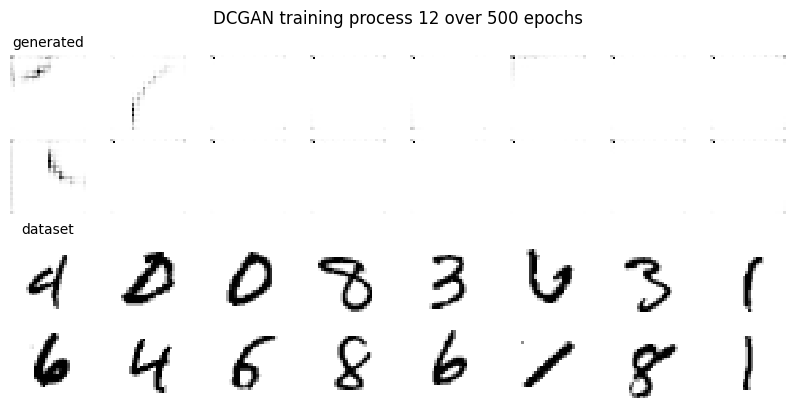

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.5164713541666667


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 73ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 73ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 71ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 72ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 75ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 72ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 74ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 74ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 72ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 74ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 72ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 73ms/step


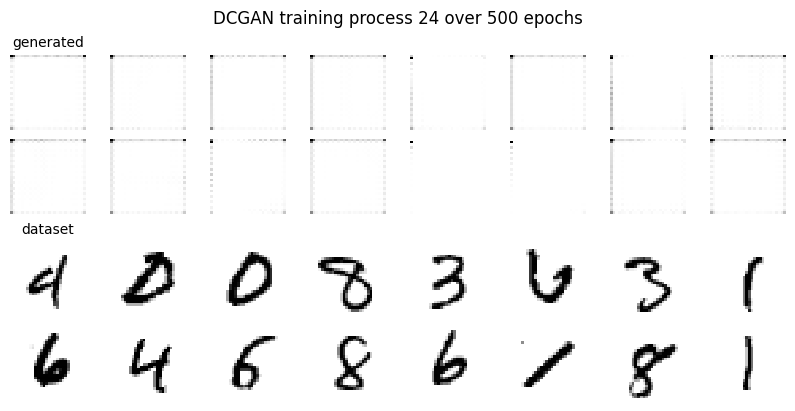

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.5135904947916666


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 72ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 76ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 72ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 95ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 72ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 76ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 74ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 74ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 75ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 74ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 74ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 74ms/step


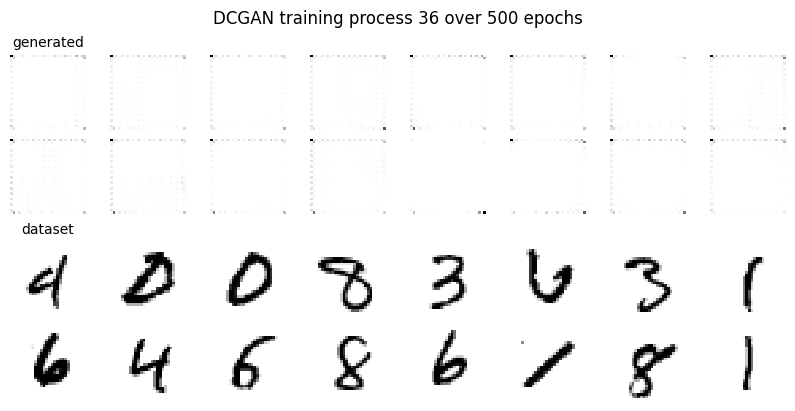

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.5159016927083333


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 75ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 72ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 72ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 75ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 76ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 80ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 79ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 82ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 84ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 80ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 80ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 86ms/step


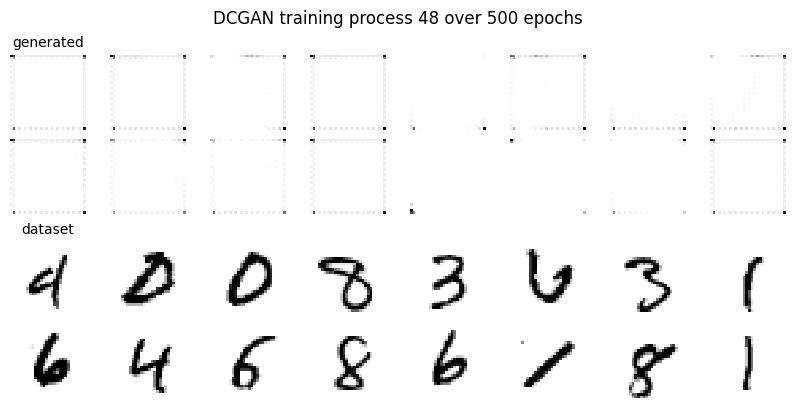

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.5077799479166667


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 79ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 72ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 78ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 76ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 74ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 80ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 77ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 94ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 77ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 77ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 76ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 77ms/step


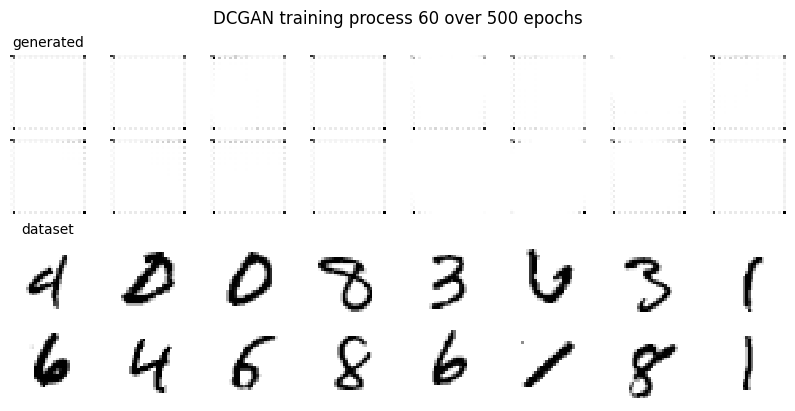

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.518603515625


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 76ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 102ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 95ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 81ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 85ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 80ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 78ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 79ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 79ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 80ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 83ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 78ms/step


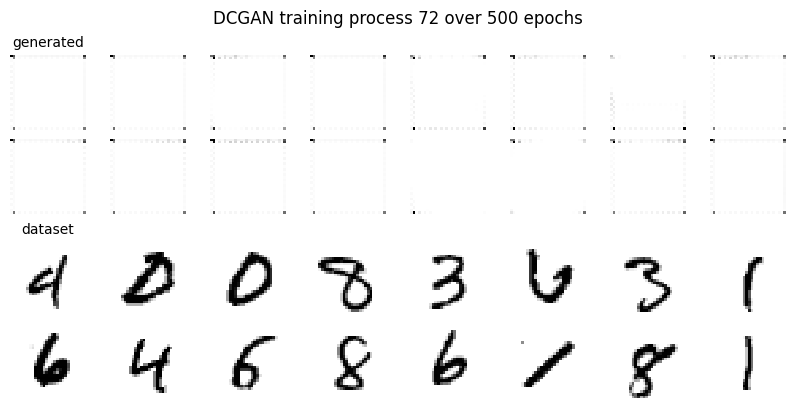

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.5144856770833334


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 79ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 103ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 77ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 79ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 82ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 81ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 79ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 80ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 84ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 81ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 82ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 82ms/step


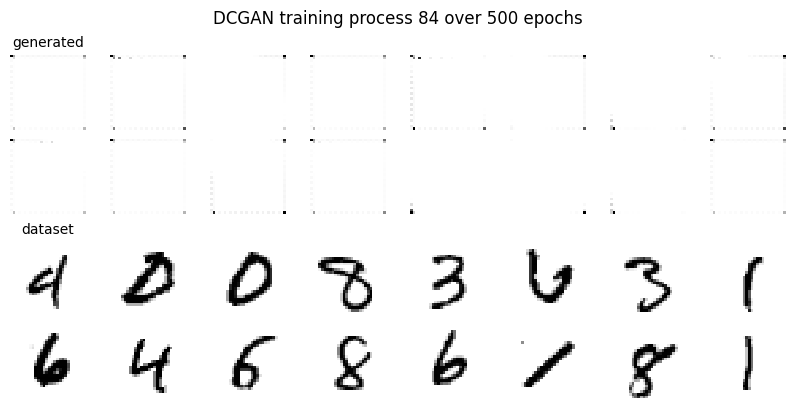

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.5090169270833333


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 82ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 82ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 82ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 82ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 82ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 84ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 83ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 82ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 82ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 81ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 82ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 81ms/step


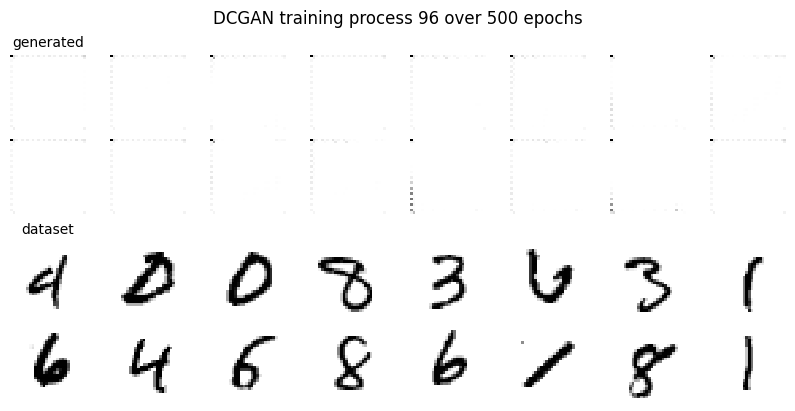

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.5100911458333334


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 82ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 83ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 84ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 85ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 88ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 83ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 85ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 82ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 84ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 84ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 85ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 86ms/step


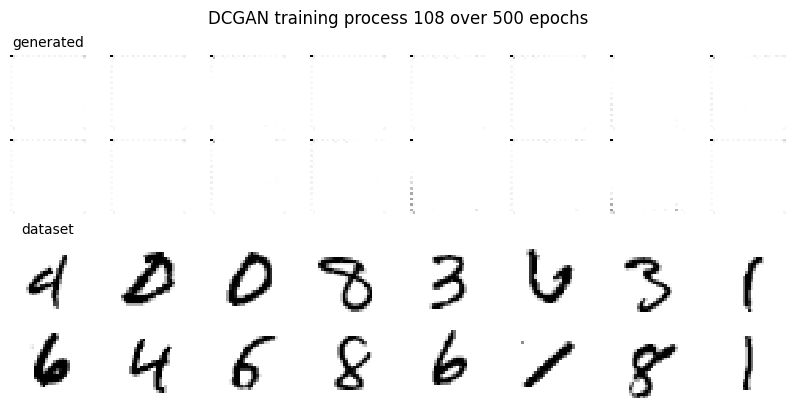

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.505712890625


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 82ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 82ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 83ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 83ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 81ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 84ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 85ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 83ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 83ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 84ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 87ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 83ms/step


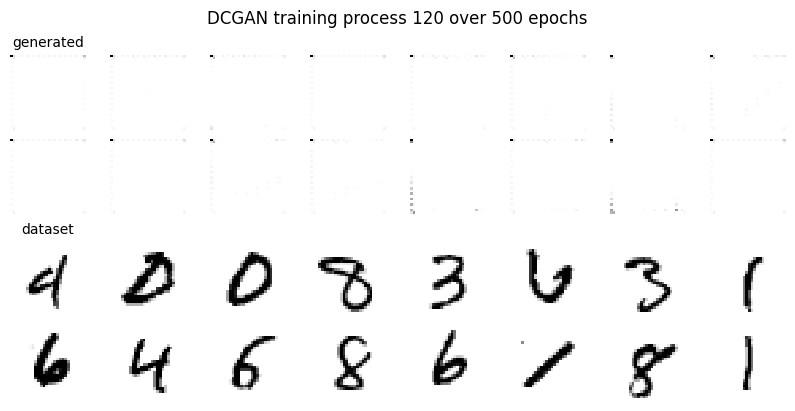

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.49708658854166665


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 85ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 85ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 90ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 86ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 87ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 87ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 86ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 88ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 84ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 86ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 84ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 87ms/step


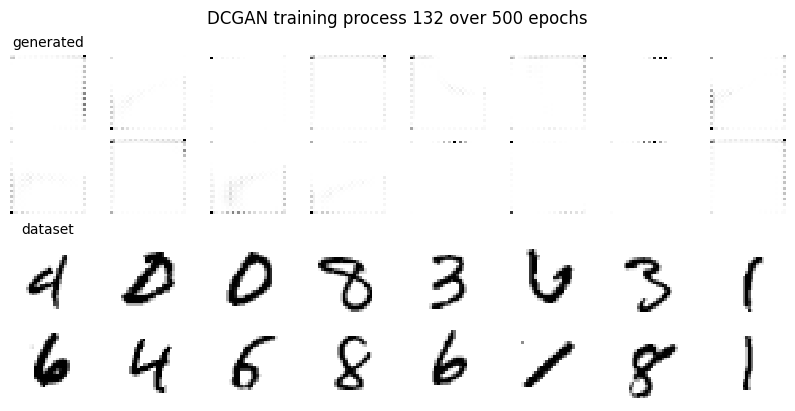

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.5043619791666667


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 86ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 86ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 87ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 87ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 90ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 88ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 86ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 88ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 88ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 87ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 87ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 89ms/step


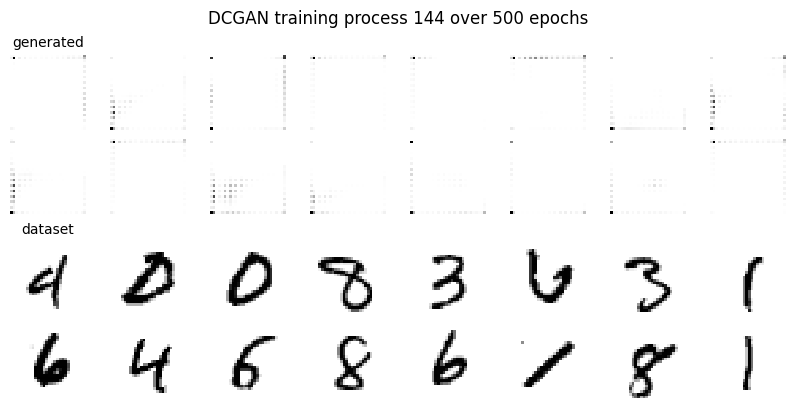

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.5091796875


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 97ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 93ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 90ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 93ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 149ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 108ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 92ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 90ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 92ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 90ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 92ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 91ms/step


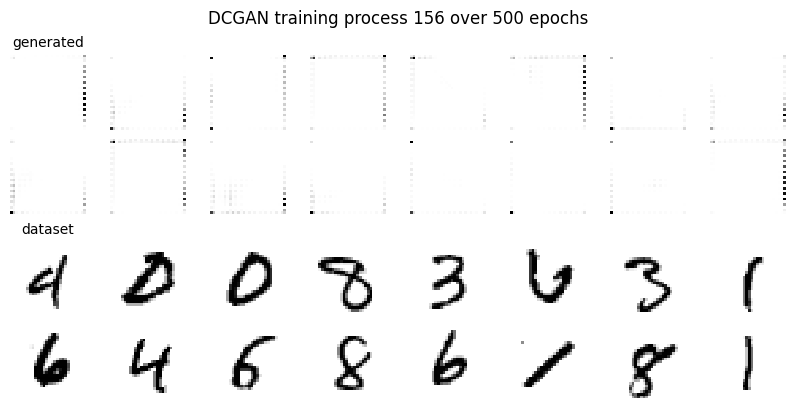

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.5076985677083333


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 96ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 90ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 93ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 94ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 92ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 93ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 95ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 93ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 95ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 93ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 98ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 94ms/step


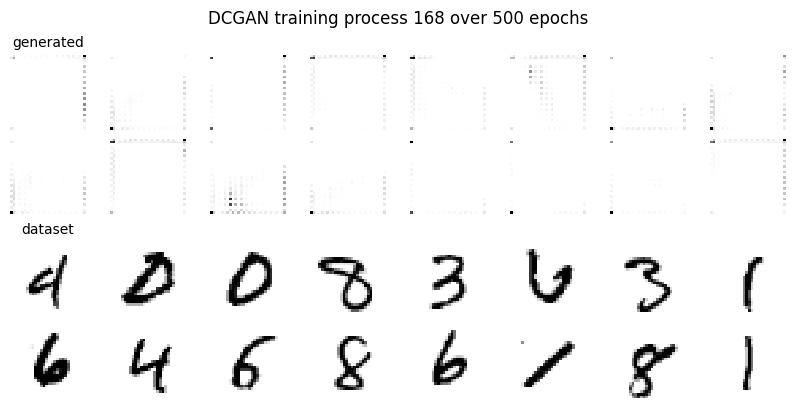

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.50859375


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 95ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 96ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 94ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 94ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 98ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 98ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 97ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 98ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 93ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 94ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 96ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 95ms/step


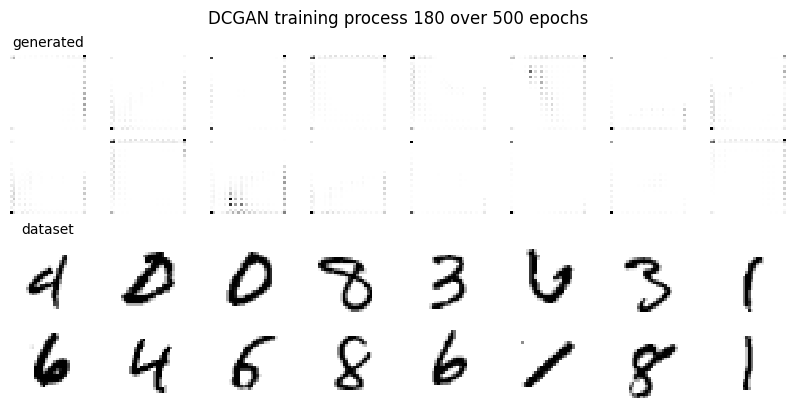

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.5057942708333333


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 96ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 95ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 96ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 95ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 99ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 97ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 99ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 99ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 98ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 109ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 130ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 112ms/step


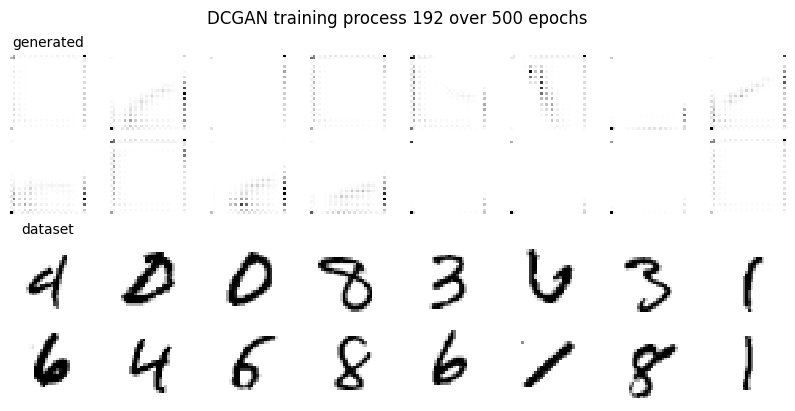

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.5060546875


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 99ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 101ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 101ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 106ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 104ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 124ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 140ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 142ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 117ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 121ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 118ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 146ms/step


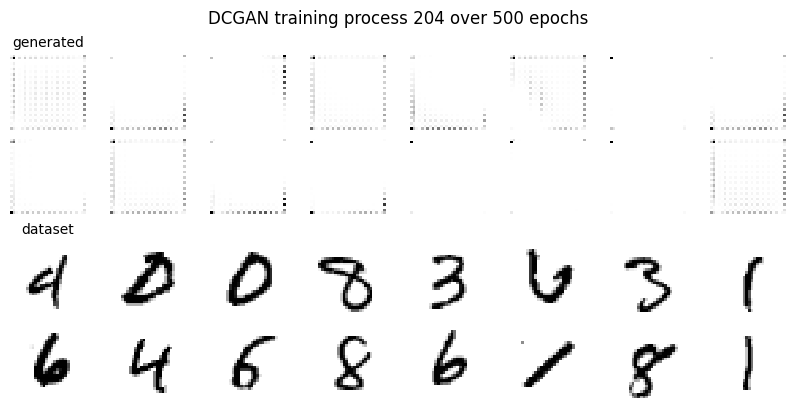

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.50517578125


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 140ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 162ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 114ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 103ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 105ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 108ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 103ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 105ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 105ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 104ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 107ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 105ms/step


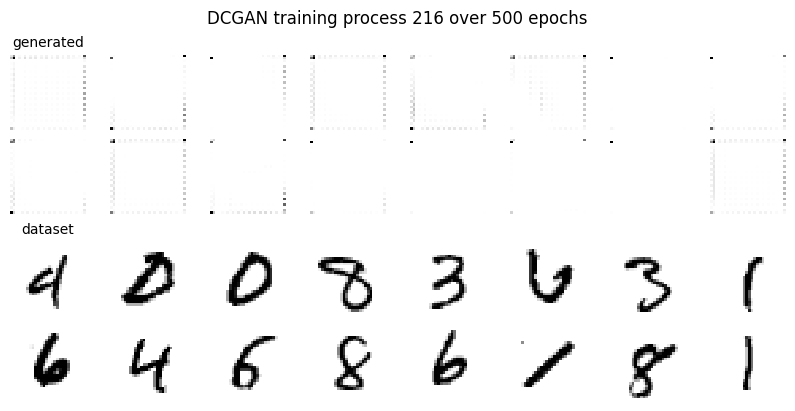

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.50732421875


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 105ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 105ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 107ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 111ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 107ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 111ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 107ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 104ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 110ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 111ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 109ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 107ms/step


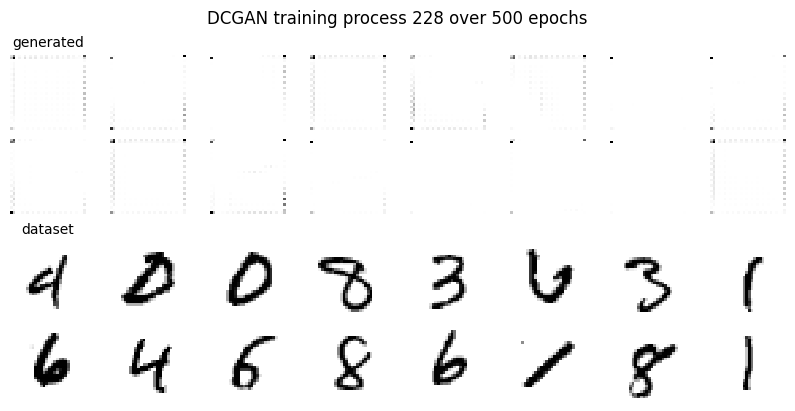

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.5056803385416667


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 116ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 125ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 108ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 122ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 111ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 125ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 114ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 113ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 113ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 109ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 111ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 110ms/step


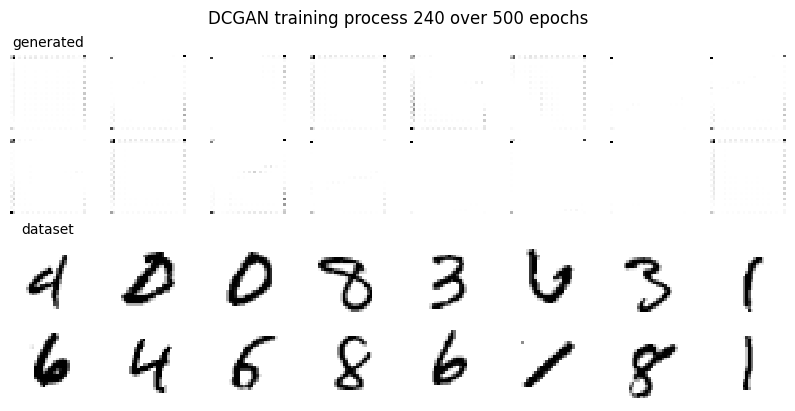

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.504638671875


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 115ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 128ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 121ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 126ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 137ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 143ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 141ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 130ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 124ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 139ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 126ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 131ms/step


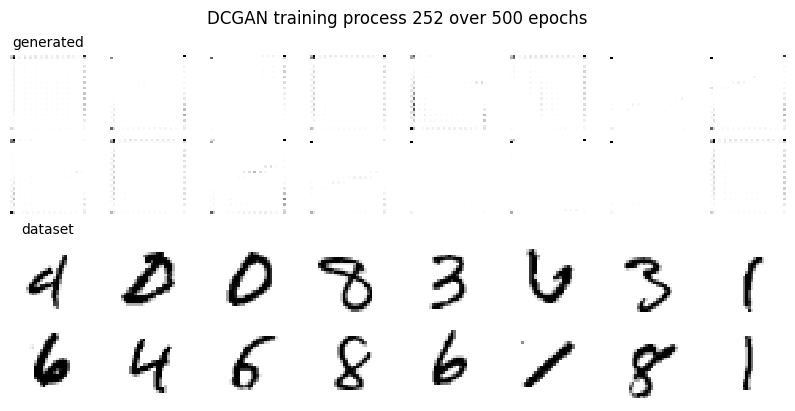

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.50380859375


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 126ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 123ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 131ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 124ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 146ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 136ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 141ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 138ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 153ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 143ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 137ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 134ms/step


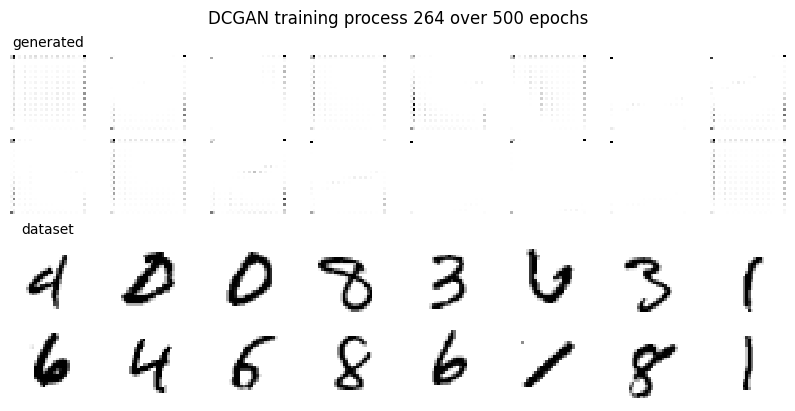

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.5026204427083333


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 146ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 142ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 139ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 138ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 137ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 144ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 139ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 132ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 137ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 131ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 133ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 141ms/step


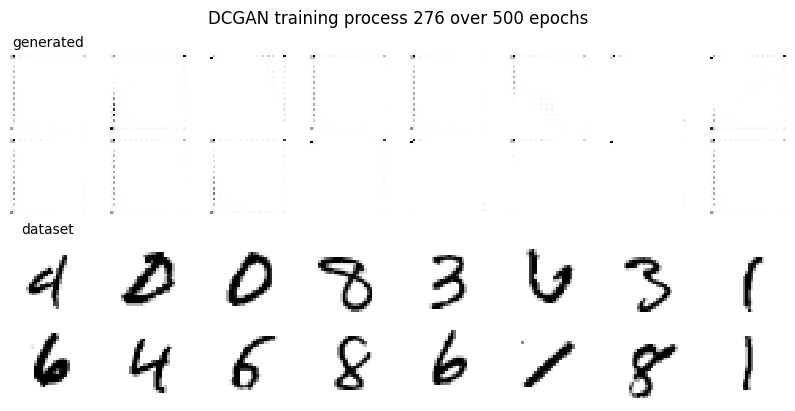

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.50283203125


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 129ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 128ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 123ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 123ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 127ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 127ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 124ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 123ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 126ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 128ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 123ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 126ms/step


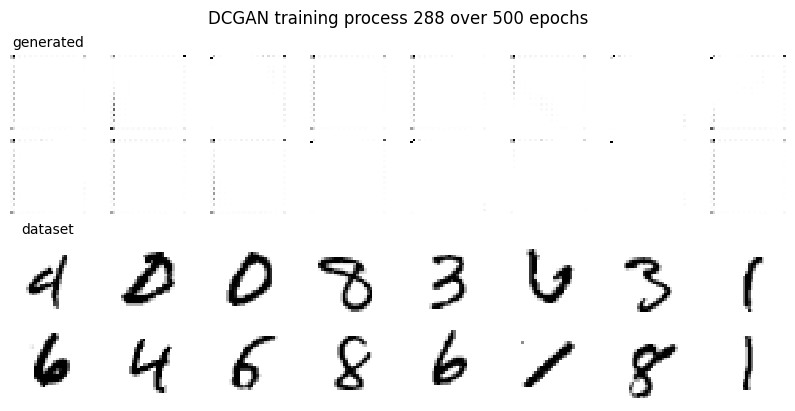

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.5026204427083333


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 129ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 126ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 124ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 135ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 129ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 124ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 122ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 127ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 129ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 128ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 127ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 129ms/step


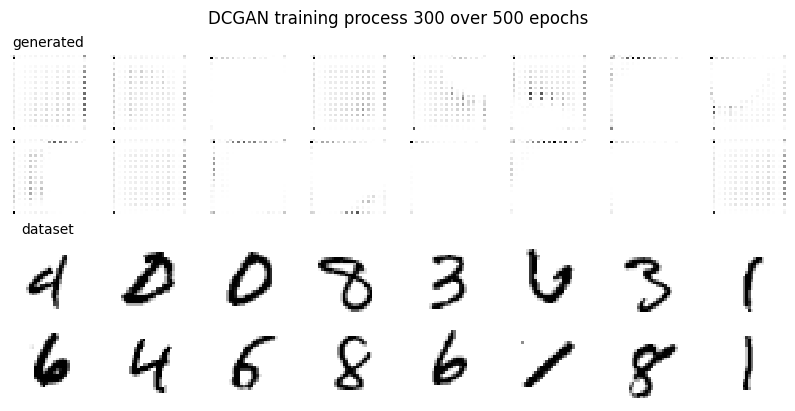

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.501025390625


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 127ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 132ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 132ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 133ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 127ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 128ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 127ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 130ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 146ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 139ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 133ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 122ms/step


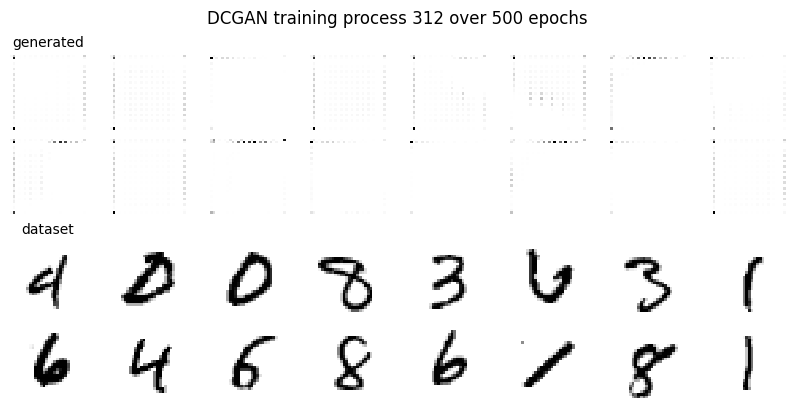

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.5026692708333333


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 133ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 136ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 130ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 127ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 125ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 134ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 131ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 209ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 166ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 136ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 148ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 141ms/step


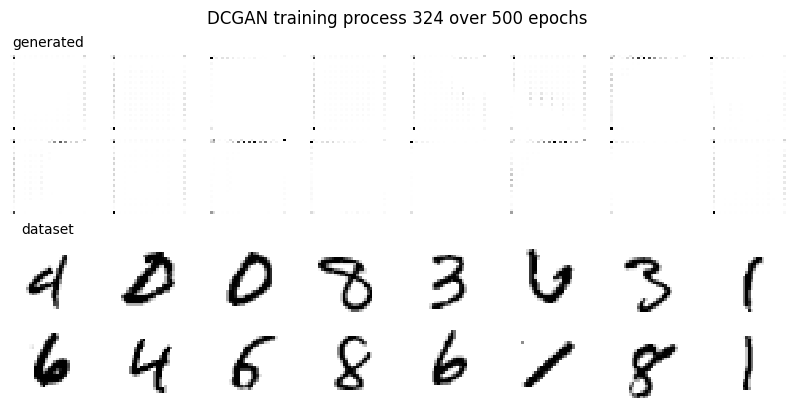

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.502734375


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 147ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 146ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 142ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 141ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 138ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 139ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 136ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 137ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 143ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 140ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 136ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 149ms/step


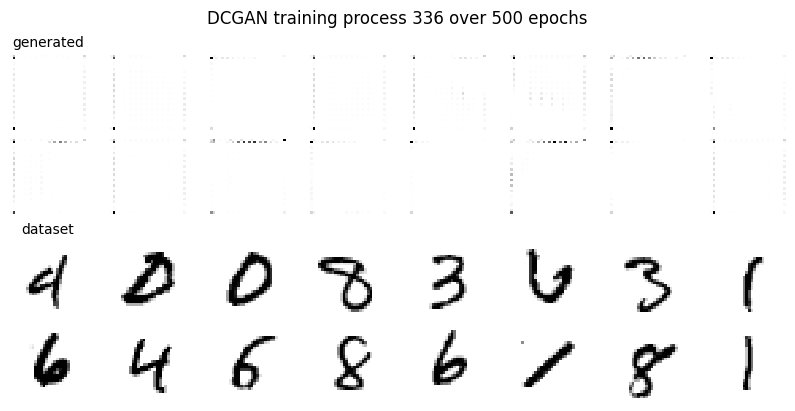

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.501611328125


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 141ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 154ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 151ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 140ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 136ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 139ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 143ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 143ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 147ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 142ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 132ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 145ms/step


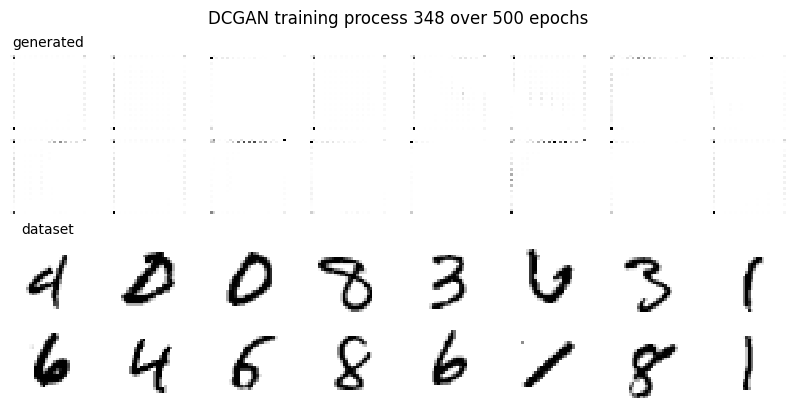

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.5010579427083334


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 146ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 143ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 140ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 158ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 142ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 149ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 149ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 156ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 140ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 168ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 150ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 150ms/step


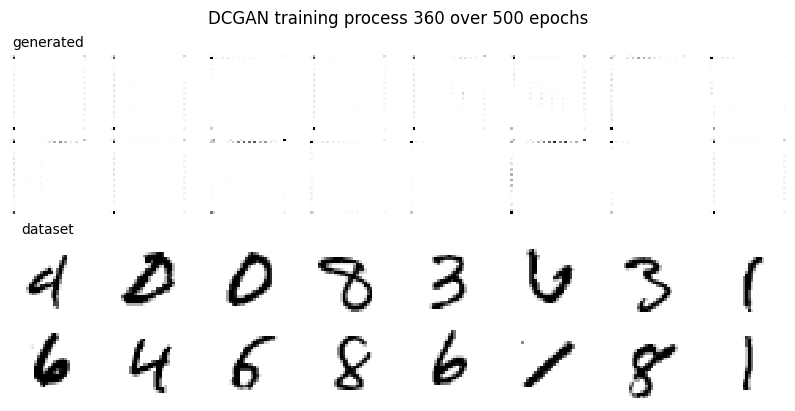

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.5011067708333333


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 147ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 147ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 138ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 149ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 152ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 160ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 149ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 183ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 148ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 148ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 162ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 155ms/step


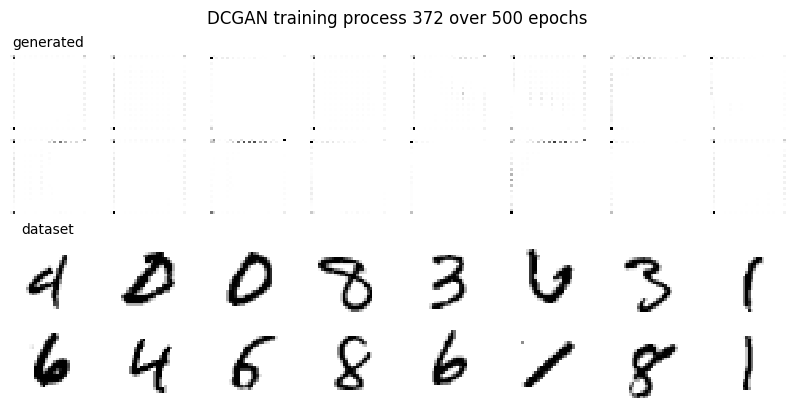

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.4998697916666667


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 154ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 144ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 164ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 145ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 150ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 147ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 153ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 149ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 143ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 150ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 155ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 154ms/step


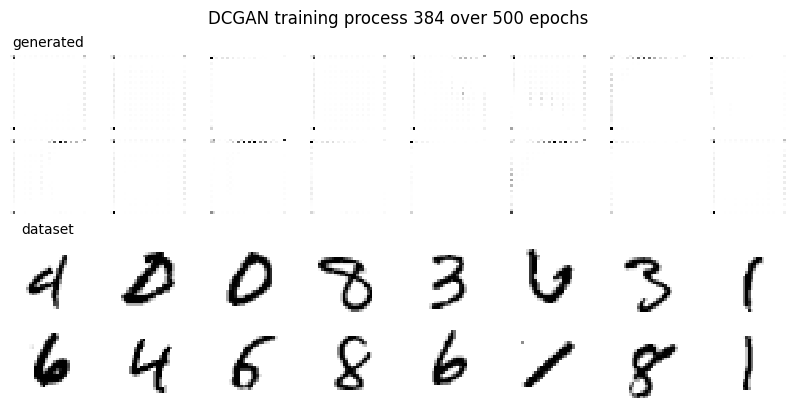

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.499365234375


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 174ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 171ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 151ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 152ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 155ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 180ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 149ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 154ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 204ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 162ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 153ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 162ms/step


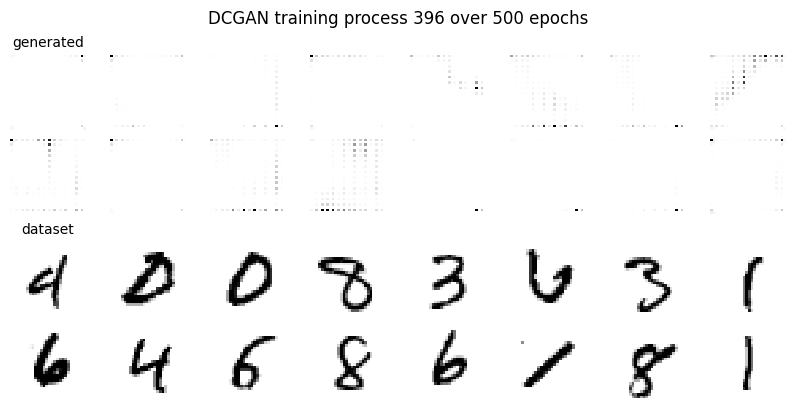

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.5012369791666667


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 163ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 152ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 171ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 158ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 168ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 153ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 156ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 156ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 158ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 156ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 153ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 163ms/step


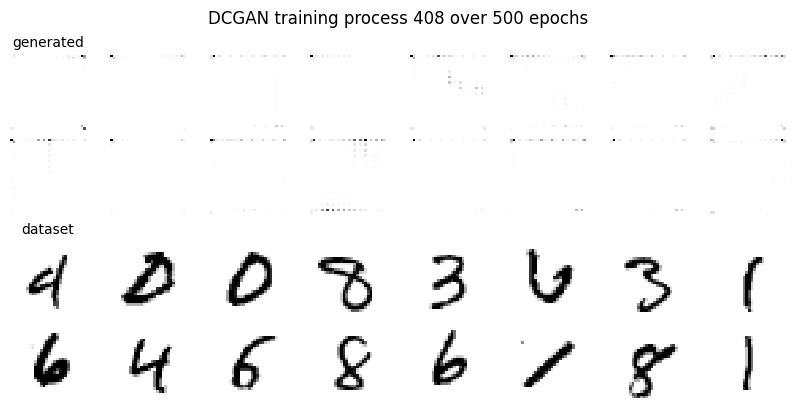

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.5026692708333333


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 160ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 161ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 153ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 164ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 161ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 167ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 165ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 194ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 168ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 161ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 157ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 179ms/step


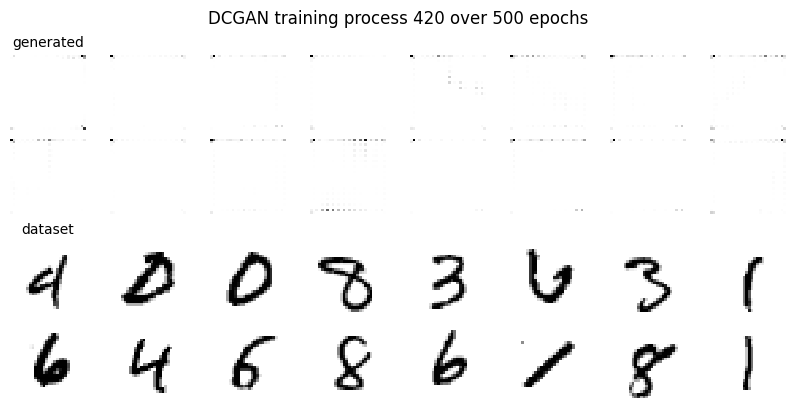

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.5029134114583333


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 166ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 154ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 165ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 165ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 157ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 168ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 165ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 150ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 164ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 178ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 160ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 174ms/step


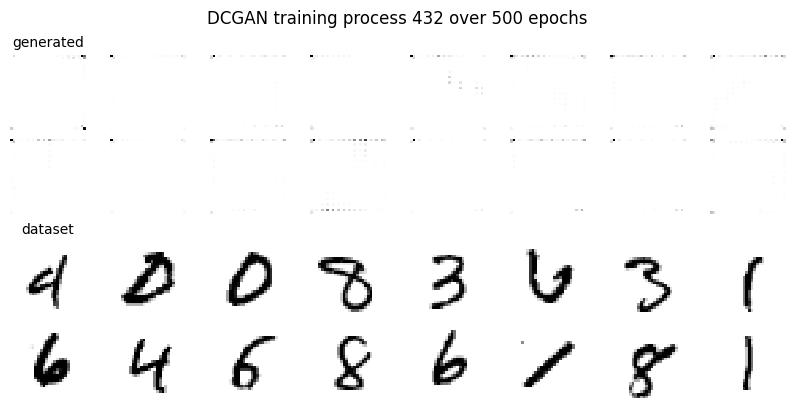

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.50263671875


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 164ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 183ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 179ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 194ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 174ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 175ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 173ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 174ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 179ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 179ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 181ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 183ms/step


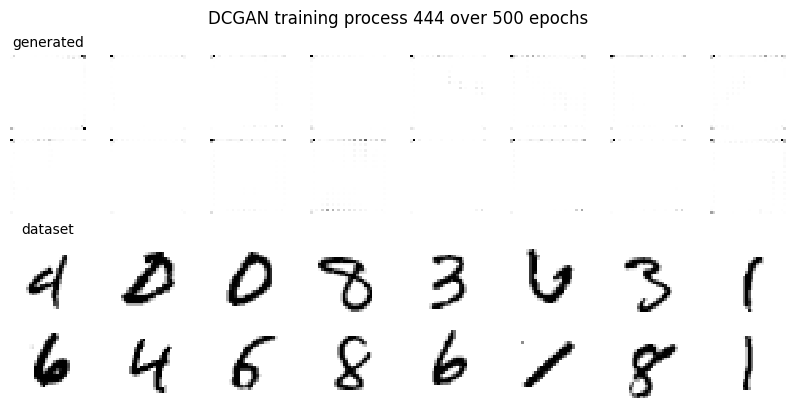

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.5021484375


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 187ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 184ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 191ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 180ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 185ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 183ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 183ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 188ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 195ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 186ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 193ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 188ms/step


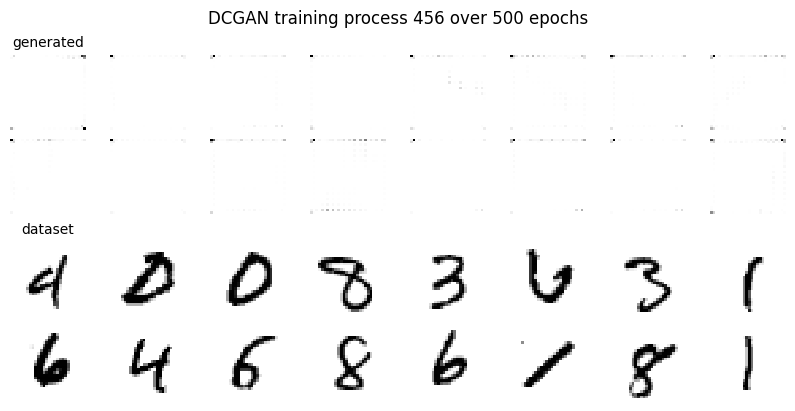

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.5018391927083333


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 189ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 199ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 188ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 187ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 185ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 192ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 183ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 188ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 182ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 186ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 196ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 190ms/step


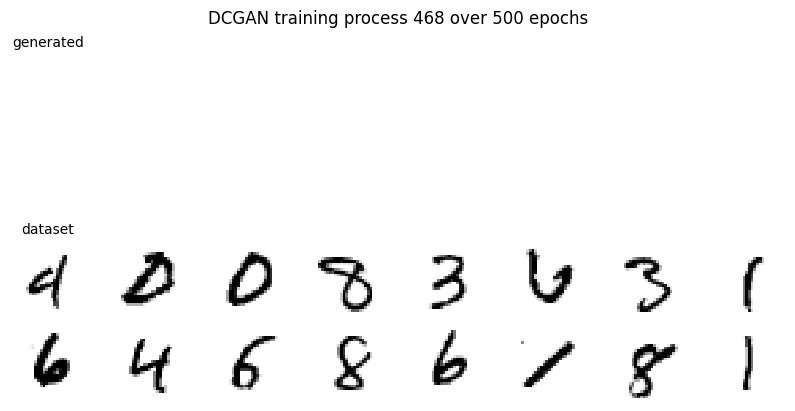

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.3155110677083333


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 191ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 190ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 182ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 199ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 193ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 181ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 195ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 192ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 195ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 190ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 183ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 192ms/step


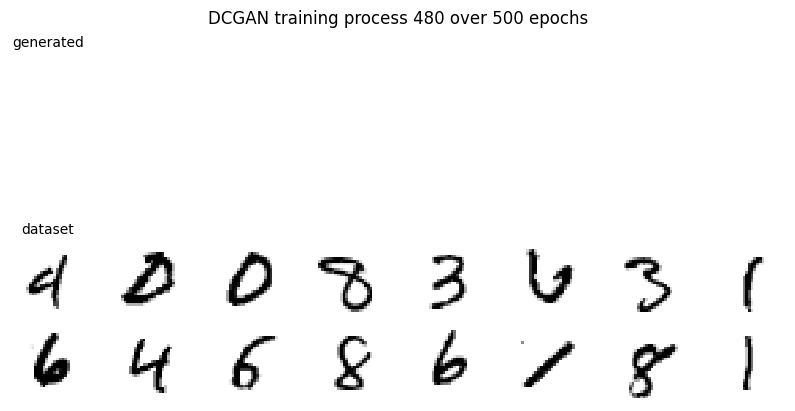

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.0


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 196ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 201ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 194ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 193ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 189ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 195ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 181ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 199ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 195ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 200ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 192ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 193ms/step


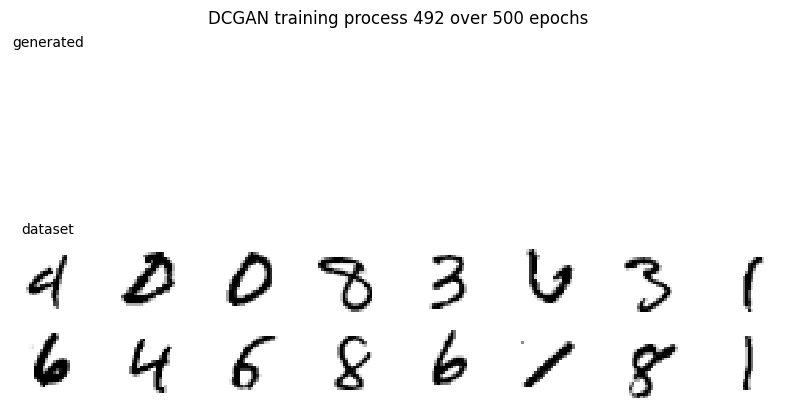

Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:
0.0


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 199ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 205ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 199ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 190ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 191ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 199ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 200ms/step


  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 203ms/step
CPU times: total: 1d 15h 9min 2s
Wall time: 15h 13min 7s


In [19]:
%%time
EPOCHS = 500
BATCH_SIZE = 128
data = DataGenerator(train_images, train_labels, batches_per_epoch=40, batch_size=BATCH_SIZE)
# масив для відслідковування стабільності навчання
generator_acc_follow = []
for epoch in tqdm(range(1, EPOCHS+1)):
    for images_batch, labels_batch in data:
        # Навчання дискримінатора
        noise = data.rand_batch()
        generated_images = generator.predict(noise)
        X = np.concatenate([images_batch, generated_images])
        # Згладжування цільових значень
        y_real = np.random.uniform(0.8, 1, size=[BATCH_SIZE])
        y_fake = np.random.uniform(0, 0.2, size=[BATCH_SIZE])
        y_real_fake = np.concatenate([y_real, y_fake])
        # Цільові значення міток
        y_labels = np.concatenate([labels_batch, np.zeros((BATCH_SIZE, DEPTH))])
        # навчаємо дискрімінатор
        discriminator.train_on_batch(X, [y_real_fake, y_labels])
        
        # Навчання генератора
        noise = data.rand_batch()
        # Вказуємо цільові значення
        y_real_fake = np.ones(BATCH_SIZE)
        # Навчаємо GAN і зберігаємо точність у масив
        generator_acc_follow.append(gan.train_on_batch(noise, [y_real_fake, noise[1]])[-1])

    # Будуємо зображення і зберігаємо його для створення .gif
    title = f"DCGAN training process {epoch} over {EPOCHS} epochs"
    if epoch%int(EPOCHS/40)==0:
        plot_generated_images(FIXED_NOISE, folder_name, title, show=True)
        print('Якщо генератор і дескрімінатор сбалансовані, точність генератора прямує в 0 або 1:')
        print(np.mean(generator_acc_follow))
        generator_acc_follow = []
    else:
        plot_generated_images(FIXED_NOISE, folder_name, title)
        
generator.save('generator_trained.h5')

  0%|          | 0/501 [00:00<?, ?it/s]

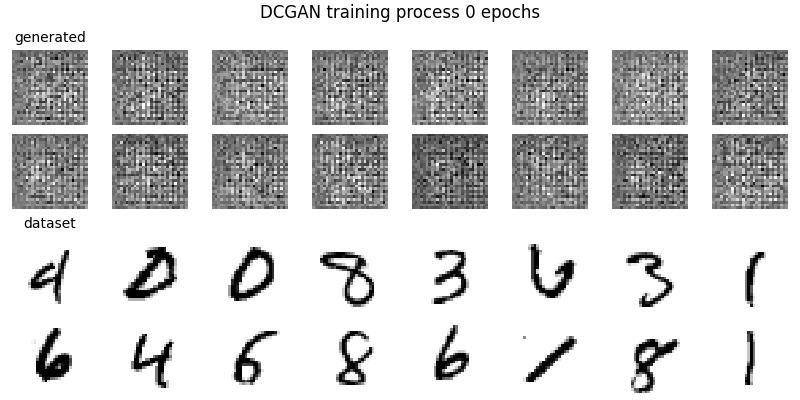

In [12]:
for folder_data in os.walk(os.path.join(folder_name)):
    all_pics_filenames = sorted(folder_data[2], key=lambda x: int(x.split()[3]))

with imageio.get_writer('DCGAN training.gif', mode='I', fps=60) as writer:
    for filename in tqdm(all_pics_filenames):
        image = imageio.imread(os.path.join(folder_name, filename))
        writer.append_data(image)
        
with open('DCGAN training.gif','rb') as f:
    display(Image(data=f.read(), format='png'))